### purpose

- split populations into training and test sets to use for cross validation of offset methods
- this cross validation will be stratified by genetic groups
- the consequence of using `StratifiedKFold` is that each pop is in the test set once and only once, and that the proportion of populations from each genetic group in the training and test sets is roughly equivalent to the proportions of that group in the full dataset.

### outline

1. [get population data](#popdata)
1. [create training and test sets](#strat)
    
    split groups for each species (print seed number), using k= size of smallest genetic group (k=3 for jp, k=4 for fdi, fdc)

    save boolean data frame, one for each species, a column for each fold, and rows for each pop

### notes
- fdi and fdc mean interior and coastal Douglas-fir; jp = jack pine

<a id='popdata'></a>
# 1. get popdata

[top](#home)

In [1]:
from pythonimports import *
from sklearn.model_selection import StratifiedKFold

DIR = makedir('/data/projects/pool_seq/phenotypic_data/offset_misc_files')

lview, dview = get_client()

latest_commit()
sinfo(html=True)

56 56
##################################################################
Current commit of pythonimports:
commit 0f67fe16b545ed556fd3ce2d4b01565e7a24831a  
Author: Brandon <brandon.lind@ubc.ca>  
Date:   Thu Jul 15 11:38:49 2021 -0600
Today:	July 23, 2021 - 11:49:12
python version: 3.8.5
##################################################################



In [2]:
# read in pops and group names (ignore envdata)
envdfs = {}

# coastal douglas-fir
envdfs['fdc'] = pd.read_table('/data/projects/pool_seq/environemental_data/change_p6/df_coastal-naturalpops_raw_env-19variables_change-p6.txt')

# interior douglas-fir
fdi = pd.read_table('/data/projects/pool_seq/environemental_data/change_p6/df_interior-naturalpops_raw_env-19variables_change-p6.txt')
fdi.loc[fdi['our_id']=='DF_p40', ['group', 'group_color']] = 'North BC', '#f205f4'
envdfs['fdi'] = fdi.copy()

# both varieties of douglas-fir
comb = pd.read_table('/data/projects/pool_seq/environemental_data/change_p6/df_ALL-naturalpops_raw_env-19variables_change-p6.txt')
envdfs['combined'] = comb.copy()

# jack pine
envdfs['jp'] = pd.read_table('/data/projects/pool_seq/environemental_data/jp_rm_p24/jp_no-p24_raw_env-19variables.txt')
envdfs['jp']['group'] = envdfs['jp']['group_color']

# western larch
envdfs['wl'] = pd.read_table('/data/projects/pool_seq/environemental_data/wl_std_env-19variables_45pops.txt')
envdfs['wl'].columns.values[-1] = 'group'

for spp,df in envdfs.items():
    df.index = df['our_id'].tolist()
    
for col in ['group', 'group_color']:
    envdfs['combined'].loc[envdfs['fdi'].index, col] = envdfs['fdi'][col]
    envdfs['combined'].loc[envdfs['fdc'].index, col] = envdfs['fdc'][col]
    

In [3]:
# look at counts per group
table(envdfs['fdi']['group'])

Counter({'Eastern BC': 6,
         'North BC': 12,
         'Tri-state': 9,
         'Montana': 4,
         'South Central BC': 4})

In [4]:
# look at counts per group
table(envdfs['fdc']['group'])

Counter({'Western BC': 11,
         'Lower Mainland': 4,
         'Washington': 7,
         'Oregon': 11,
         'California': 5})

In [5]:
# look at counts per group
table(envdfs['jp']['group'])

Counter({'green': 11, 'blue': 15, 'darkorange': 10, 'magenta': 3})

In [6]:
# look at counts per group
table(envdfs['wl']['group'])

Counter({'green': 27, 'blue': 18})

In [7]:
# look at counts per group
Counter(envdfs['combined']['group'])

Counter({'Western BC': 11,
         'Lower Mainland': 4,
         'Eastern BC': 6,
         'North BC': 12,
         'Tri-state': 9,
         'Washington': 7,
         'Oregon': 11,
         'California': 5,
         'Montana': 4,
         'South Central BC': 4})

In [8]:
# make sure all of the 
assert sum(Counter(envdfs['combined']['group']).values()) == nrow(envdfs['fdi']) + nrow(envdfs['fdc'])

<a id='strat'></a>

# create training and test sets for each species/variety

[top](#home)

In [9]:
def strat_split(envdata, k, seed=None):
    """Randomly split `envdata` (pop names) into test and training sets."""
    if seed is None:
        seed = random.randint(0, 5000)

    skf = StratifiedKFold(n_splits=k, random_state=seed, shuffle=True)
    
    train_sets = []
    test_sets = []
    for train_index, test_index in skf.split(envdata, envdata['group']):
        train_sets.append(
            envdata.iloc[list(train_index)]['our_id'].tolist()
        )
        test_sets.append(
            envdata.iloc[list(test_index)]['our_id'].tolist()
        )

    return train_sets, test_sets, seed

In [10]:
# seeds assigned in previous runs of the notebook
spp_seeds = dict(fdc =  1809,
                 fdi =  2521,
                 jp =  2966,
                 wl =  1556)

In [11]:
# get train/test pops for the kfold cross validation
train_data = {}
test_data = {}
for spp,df in envdfs.items():
    train_sets,test_sets,seed = strat_split(df,
                                            k=3 if spp=='jp' else 4,
                                            seed=spp_seeds[spp] if spp in spp_seeds else None
                                           )
    print(spp, 'seed = ', seed)
    for kfold,pops in enumerate(train_sets):
        assert len(train_sets[kfold])+len(test_sets[kfold]) == nrow(df)
        assert len(set(test_sets[kfold]).intersection(train_sets[kfold])) == 0

    train_data[spp] = train_sets
    test_data[spp] = test_sets
# fdc seed =  1809
# fdi seed =  2521
# jp seed =  2966
# wl seed =  1556

fdc seed =  1809
fdi seed =  2521
combined seed =  1670
jp seed =  2966
wl seed =  1556


In [12]:
# get percentages of each group within all data and each k-fold training set - make sure is similar to `group_perc`
percs = {}
for spp,df in envdfs.items():
    x = df[['group', 'our_id']].groupby('group').count()
    x.index.name = None
    x.columns = ['group_count']
    x['group_perc'] = x['group_count'] / x['group_count'].sum()
    for kfold,pops in enumerate(train_data[spp]):
        kfold = kfold + 1
        x[f'k{kfold}_count'] = x.index.map(Counter(df.loc[pops, 'group']))
        x[f'k{kfold}_perc'] = x[f'k{kfold}_count'] / x[f'k{kfold}_count'].sum()
        assert round(x['group_perc'].sum(), 4) == round(x[f'k{kfold}_perc'].sum(), 4) == 1.0
        
    percs[spp] = x.copy()
    print(ColorText(spp).bold().blue())
    display(percs[spp])

fdc


,group_count,group_perc,k1_count,k1_perc,k2_count,k2_perc,k3_count,k3_perc,k4_count,k4_perc
California,5,0.131579,4,0.142857,3,0.107143,4,0.137931,4,0.137931
Lower Mainland,4,0.105263,3,0.107143,3,0.107143,3,0.103448,3,0.103448
Oregon,11,0.289474,8,0.285714,9,0.321429,8,0.275862,8,0.275862
Washington,7,0.184211,5,0.178571,5,0.178571,6,0.206897,5,0.172414
Western BC,11,0.289474,8,0.285714,8,0.285714,8,0.275862,9,0.310345


fdi


,group_count,group_perc,k1_count,k1_perc,k2_count,k2_perc,k3_count,k3_perc,k4_count,k4_perc
Eastern BC,6,0.171429,4,0.153846,4,0.153846,5,0.192308,5,0.185185
Montana,4,0.114286,3,0.115385,3,0.115385,3,0.115385,3,0.111111
North BC,12,0.342857,9,0.346154,9,0.346154,9,0.346154,9,0.333333
South Central BC,4,0.114286,3,0.115385,3,0.115385,3,0.115385,3,0.111111
Tri-state,9,0.257143,7,0.269231,7,0.269231,6,0.230769,7,0.259259


combined


,group_count,group_perc,k1_count,k1_perc,k2_count,k2_perc,k3_count,k3_perc,k4_count,k4_perc
California,5,0.068493,3,0.055556,4,0.072727,4,0.072727,4,0.072727
Eastern BC,6,0.082192,4,0.074074,5,0.090909,5,0.090909,4,0.072727
Lower Mainland,4,0.054795,3,0.055556,3,0.054545,3,0.054545,3,0.054545
Montana,4,0.054795,3,0.055556,3,0.054545,3,0.054545,3,0.054545
North BC,12,0.164384,9,0.166667,9,0.163636,9,0.163636,9,0.163636
Oregon,11,0.150685,9,0.166667,8,0.145455,8,0.145455,8,0.145455
South Central BC,4,0.054795,3,0.055556,3,0.054545,3,0.054545,3,0.054545
Tri-state,9,0.123288,7,0.129630,6,0.109091,7,0.127273,7,0.127273
Washington,7,0.095890,5,0.092593,6,0.109091,5,0.090909,5,0.090909
Western BC,11,0.150685,8,0.148148,8,0.145455,8,0.145455,9,0.163636


jp


,group_count,group_perc,k1_count,k1_perc,k2_count,k2_perc,k3_count,k3_perc
blue,15,0.384615,10,0.384615,10,0.384615,10,0.384615
darkorange,10,0.256410,7,0.269231,7,0.269231,6,0.230769
green,11,0.282051,7,0.269231,7,0.269231,8,0.307692
magenta,3,0.076923,2,0.076923,2,0.076923,2,0.076923


wl


,group_count,group_perc,k1_count,k1_perc,k2_count,k2_perc,k3_count,k3_perc,k4_count,k4_perc
blue,18,0.4,13,0.393939,14,0.411765,14,0.411765,13,0.382353
green,27,0.6,20,0.606061,20,0.588235,20,0.588235,21,0.617647


In [13]:
# display test/train assignemnts in a dataframe for reproducibility - don't worry I didn't look :) (really, I didn't)
dfs = {}
for spp,data in train_data.items():
    df = pd.DataFrame(index=envdfs[spp]['our_id'].tolist())
    for kfold,pops in enumerate(data):
        df[f'k{kfold+1} training'] = df.index.isin(pops)
    dfs[spp] = df.copy()
    print(ColorText(spp).blue())
    display(dfs[spp])

fdc


,k1 training,k2 training,k3 training,k4 training
DF_p1,True,True,False,True
DF_p2,True,True,True,False
DF_p6,True,False,True,True
DF_p10,True,True,True,False
DF_p11,True,True,False,True
DF_p12,False,True,True,True
DF_p13,True,True,True,False
DF_p14,False,True,True,True
DF_p15,False,True,True,True
DF_p16,True,True,False,True


fdi


,k1 training,k2 training,k3 training,k4 training
DF_p3,True,False,True,True
DF_p4,True,False,True,True
DF_p5,True,False,True,True
DF_p7,True,True,True,False
DF_p8,True,True,True,False
DF_p9,False,True,True,True
DF_p18,True,True,False,True
DF_p19,True,True,False,True
DF_p20,True,True,True,False
DF_p33,False,True,True,True


combined


,k1 training,k2 training,k3 training,k4 training
DF_p1,False,True,True,True
DF_p2,True,True,True,False
DF_p3,False,True,True,True
DF_p4,True,True,True,False
DF_p5,False,True,True,True
...,...,...,...,...
DF_p80,False,True,True,True
DF_p81,True,True,True,False
DF_p82,True,True,False,True
DF_p83,True,True,False,True


jp


,k1 training,k2 training,k3 training
JP_p98,True,True,False
JP_p73,False,True,True
JP_p97,False,True,True
JP_p60,True,False,True
JP_p100,True,True,False
JP_p42,True,True,False
JP_p103,False,True,True
JP_p48,True,True,False
JP_p79,False,True,True
JP_p31,True,True,False


wl


,k1 training,k2 training,k3 training,k4 training
WL_p272,True,True,False,True
WL_p281,True,True,True,False
WL_p285,True,True,True,False
WL_p287,True,False,True,True
WL_p291,True,True,True,False
WL_p295,False,True,True,True
WL_p298,True,True,False,True
WL_p303,True,False,True,True
WL_p306,True,True,True,False
WL_p307,True,True,True,False


In [14]:
# make sure the previous test/train splits are the same using the seeds from last time
test = pklload(op.join(DIR, 'train_test_assignment_for_kfold_crossval.pkl'))
for spp,df in test.items():
    assert all(df == dfs[spp])

In [15]:
# the consequence of using stratified sampling is that each pop is in the test set once and only once
for spp,df in dfs.items():
    for pop,data in df.iterrows():
        assert sum(data == False) == 1

In [16]:
# save fold assignments by overwriting previous file
pkldump(dfs, op.join(DIR, 'train_test_assignment_for_kfold_crossval.pkl'))

# show test populations - for reproducibility, I'm not looking at these

plot on a map which populations will be used for cross validation across the folds

In [17]:
extent = {'jp': [-119.5, -58, 41, 60],
          'fdi': [-130, -112.5, 37.5, 55.5],
          'fdc': [-130, -112.5, 37.5, 55.5],
          'combined' : [-130, -112.5, 37.5, 55.5],
          'wl': [-122.32, -112.55, 43.26, 51.6]}

figsize = {'jp': (15, 10),
           'fdi': (8, 15),
           'fdc': (8, 15),
           'combined' : (8, 15),
           'wl': (8, 15)}

shapefiles = {'jp': [('green', '/data/projects/pool_seq/environemental_data/shapefiles/jackpine.shp')],
              'fdi': [('purple', '/data/projects/pool_seq/environemental_data/shapefiles/Interior_DF.shp')],
              'fdc': [('lime', '/data/projects/pool_seq/environemental_data/shapefiles/Coastal_DF.shp')],
              'combined' : [('purple', '/data/projects/pool_seq/environemental_data/shapefiles/Interior_DF.shp'),
                            ('lime', '/data/projects/pool_seq/environemental_data/shapefiles/Coastal_DF.shp')],
              'wl': [('blue', '/data/projects/pool_seq/environemental_data/shapefiles/larch_gis/lariocci.shp')]}

def plot_maps(spp, latcol='LAT', loncol='LONG'):
    for kfold,pops in enumerate(test_data[spp]):
        print(ColorText(f'K={kfold+1}').bold())

        ax = basemap(extent=extent[spp],
                     figsize=figsize[spp],
                     shapefiles=shapefiles[spp])

        for pop in envdfs[spp].index:
            color_col = 'group_color' if spp != 'wl' else 'group'
            lat,long,color = envdfs[spp].loc[pop, [latcol, loncol, color_col]]
            label = pop if pop in pops else None
            draw_pie_marker([1,0], long, lat, 200, [color], ax=ax, transform=True, label=label)

        plt.show()

K=1


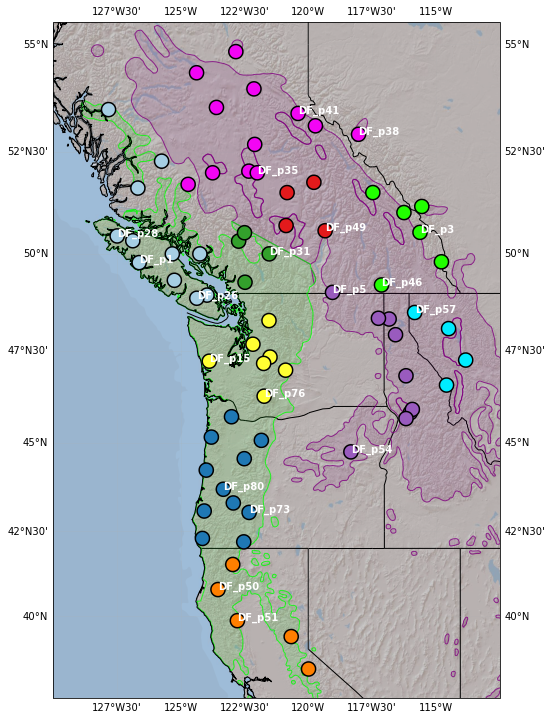

K=2


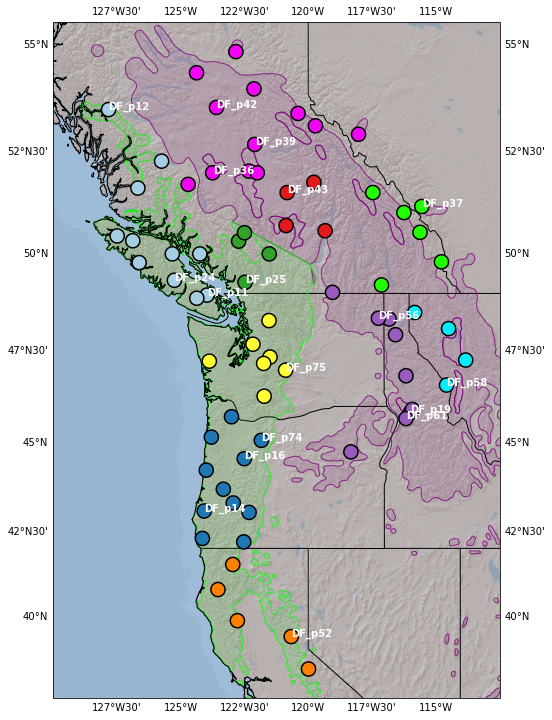

K=3


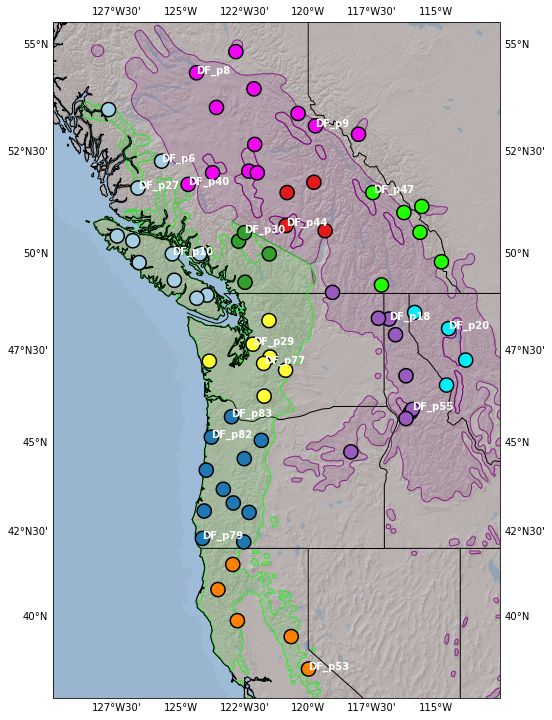

K=4


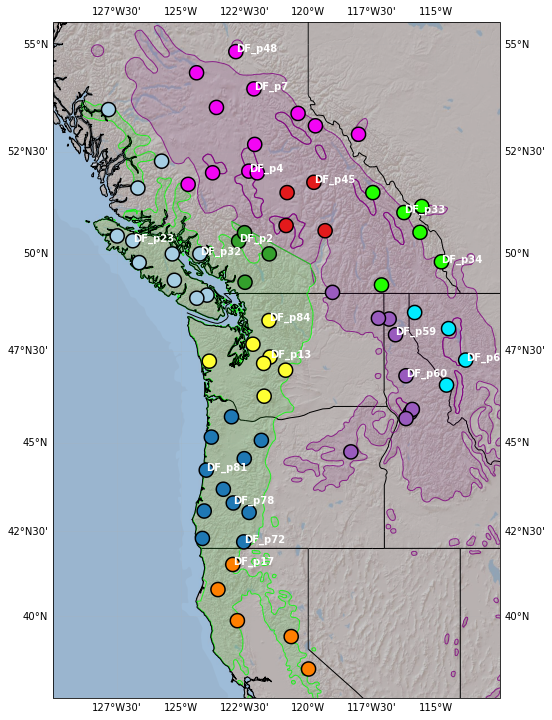

In [18]:
plot_maps('combined')

K=1


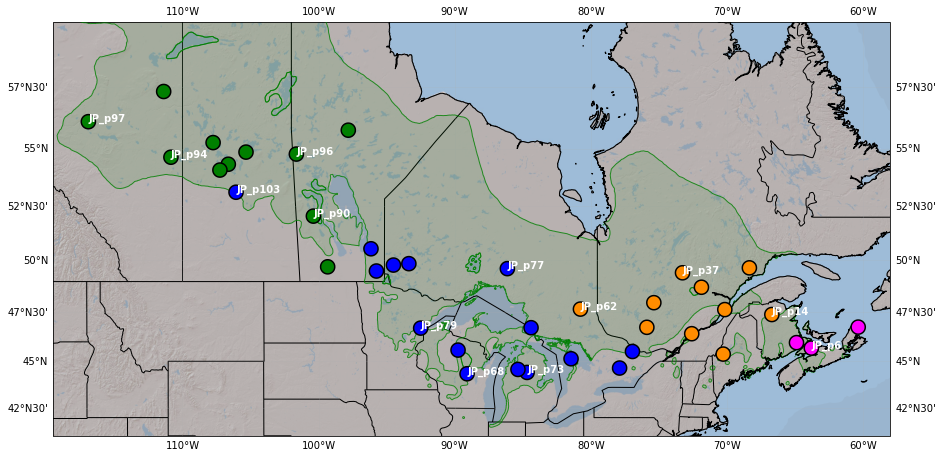

K=2


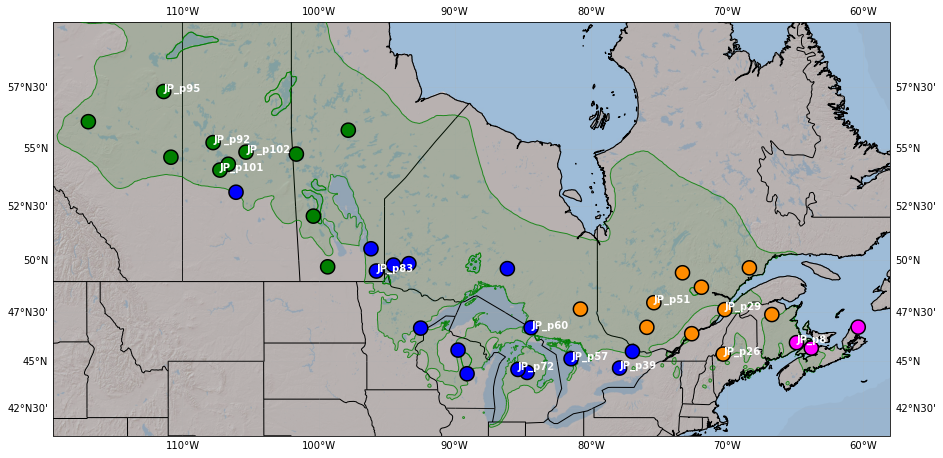

K=3


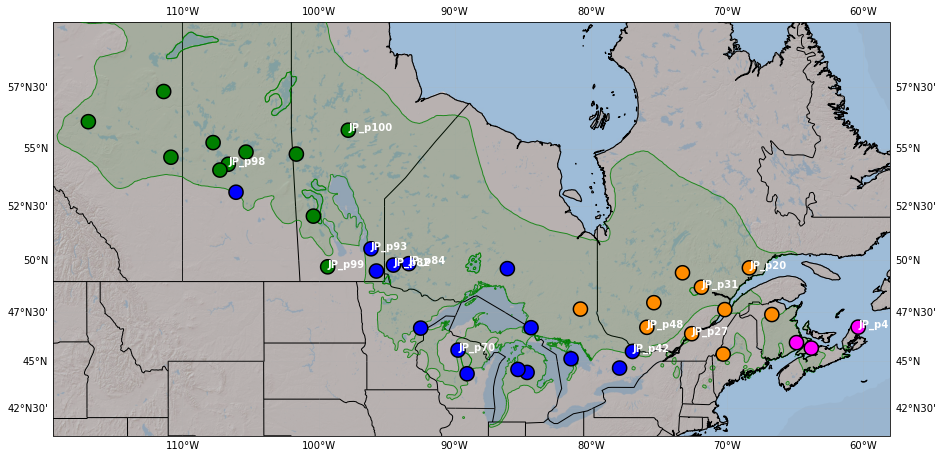

In [19]:
plot_maps('jp')

K=1


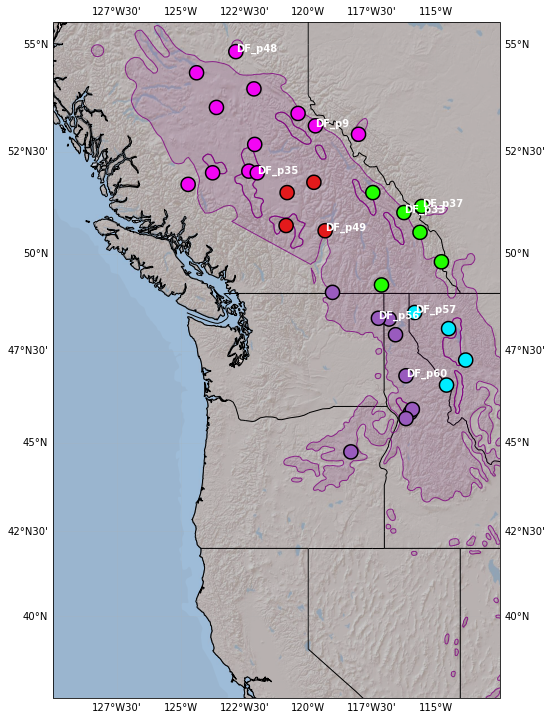

K=2


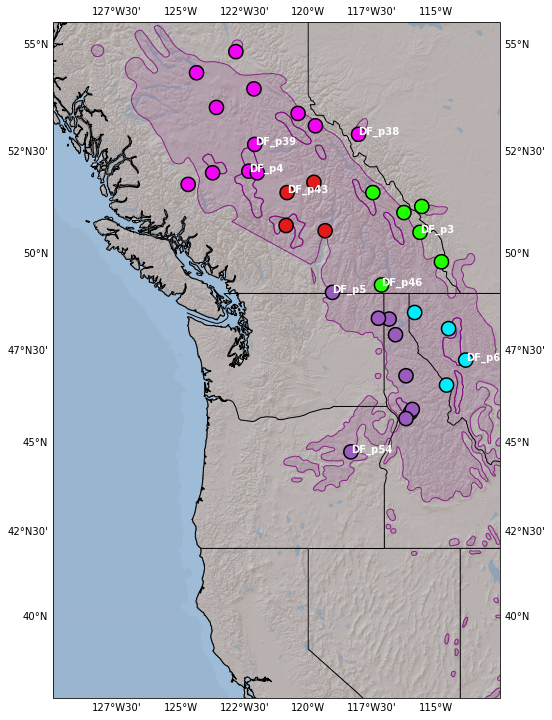

K=3


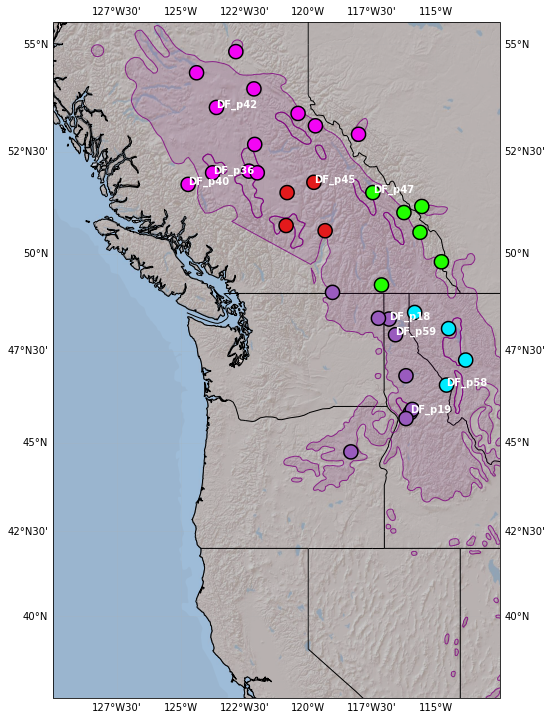

K=4


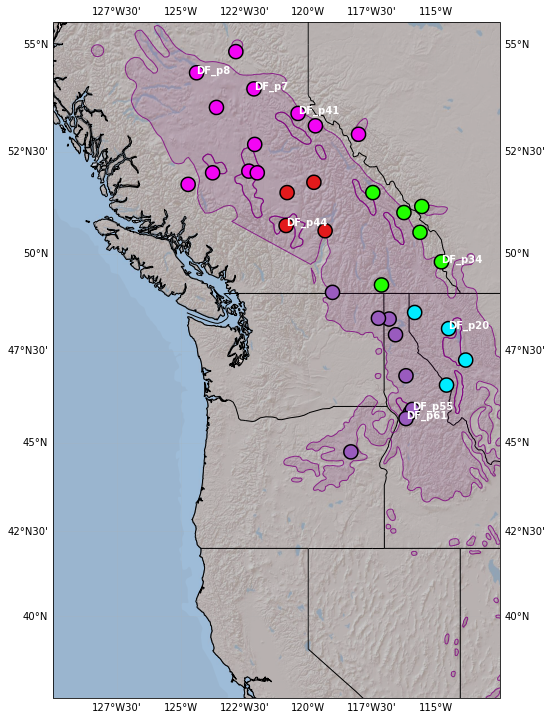

In [20]:
plot_maps('fdi')

K=1


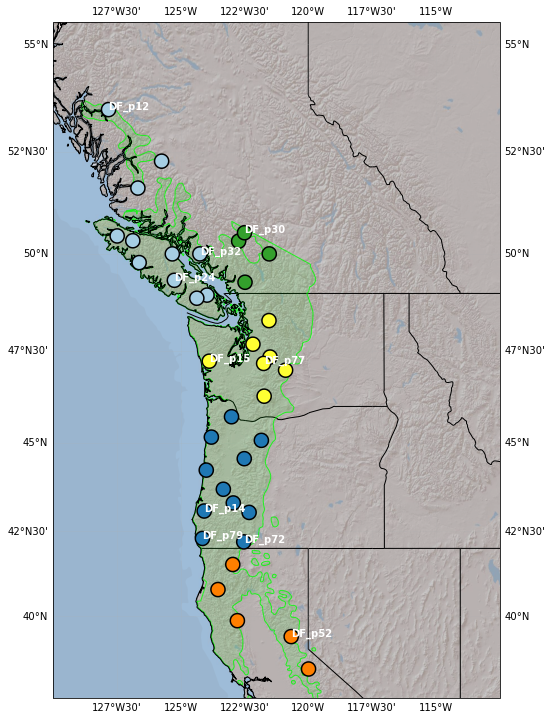

K=2


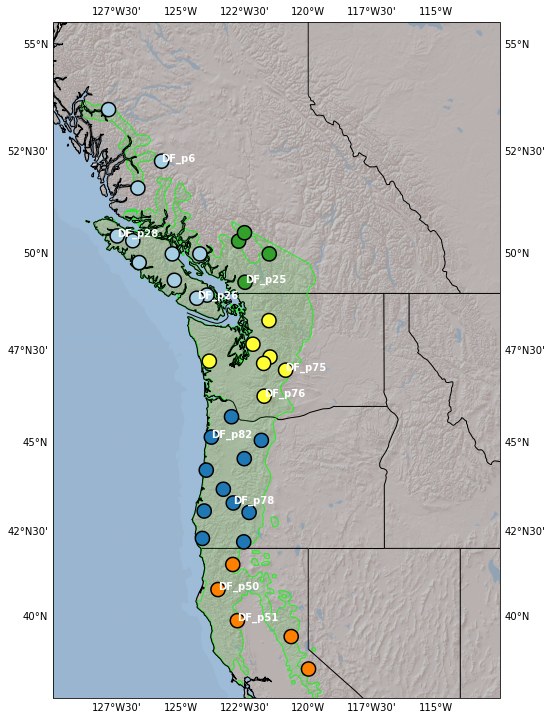

K=3


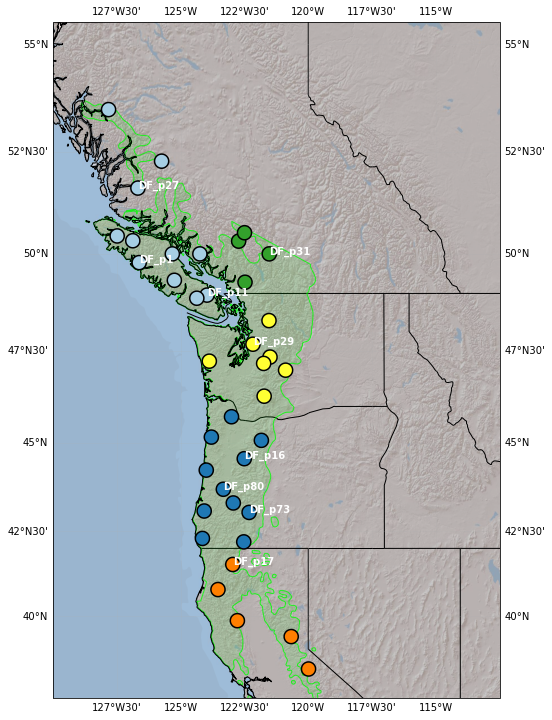

K=4


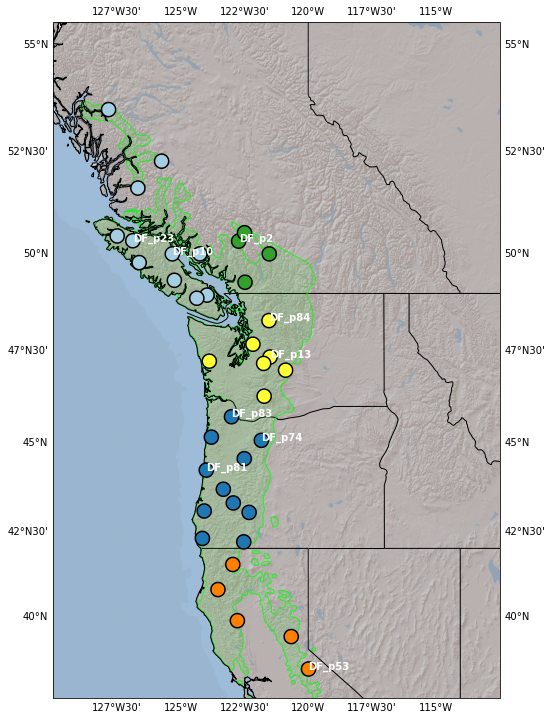

In [21]:
plot_maps('fdc')

K=1


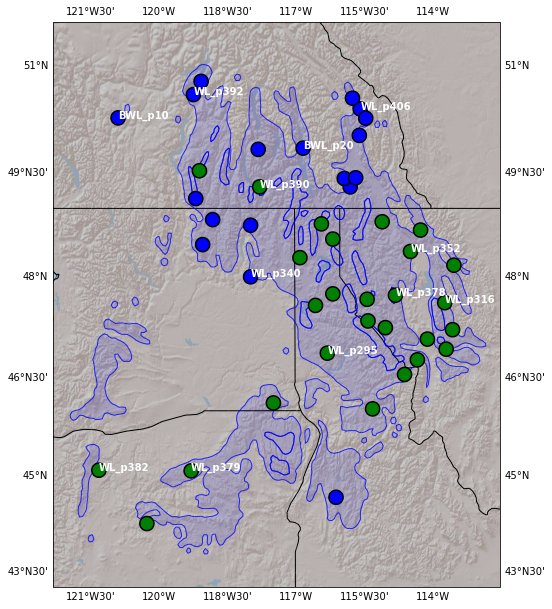

K=2


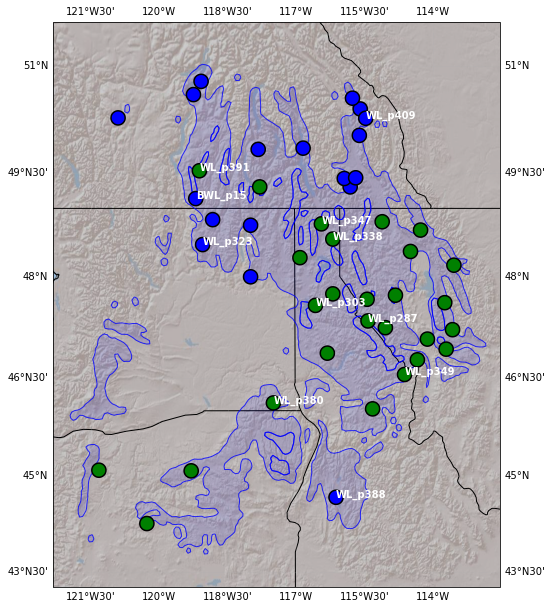

K=3


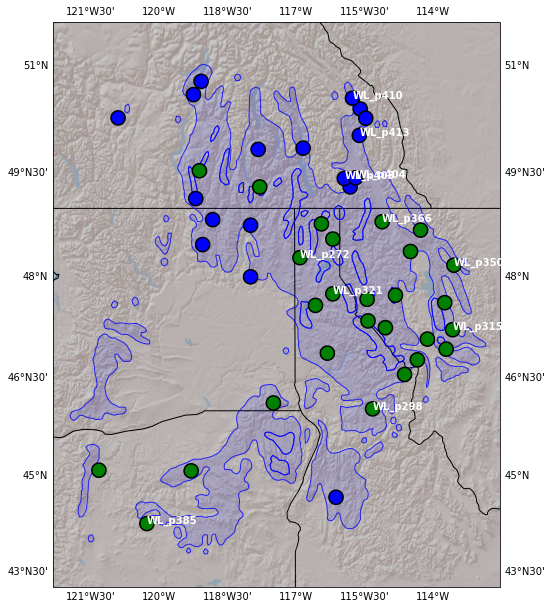

K=4


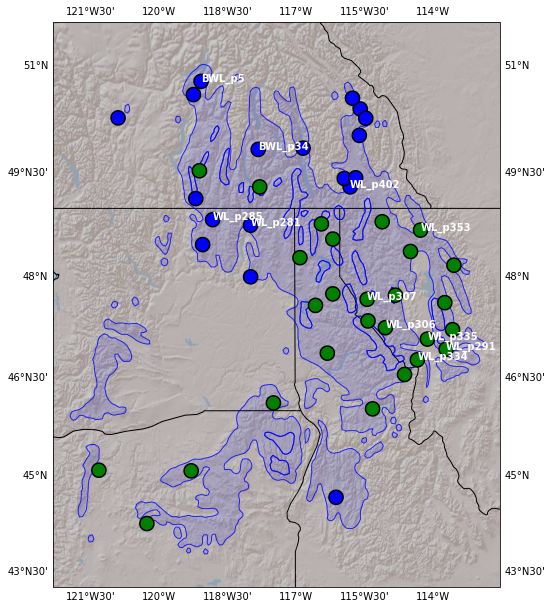

In [22]:
plot_maps('wl', latcol='Latitude', loncol='Longitude')